# Animating a moving body in Jupyter
Here we use libraries for math and for plotting
Notice that i varies from 1 to 360 and using sin and cos we get a circular orbit


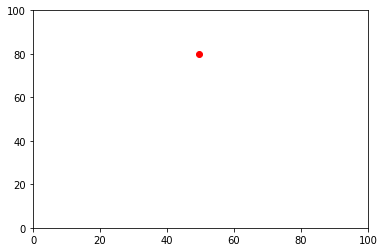

In [17]:
# projectiles animation
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation
from IPython.display import HTML

fig = plt.figure()
ax = plt.axes(xlim=(0, 100), ylim=(0, 100))
line, = ax.plot(0, 0, "ro-",alpha=1.0)       # alpha controls the transparency between 0-1

def animate(i):
    x = 50 + 30 * np.sin(np.radians(i))
    y = 50 + 30 * np.cos(np.radians(i))
    line.set_data(x,y)                       # line can accept an array of x and an array of y
    return line,

anim = animation.FuncAnimation(fig, animate, 
                               frames=360,   # total number of frames
                               interval=20,  # look this up
                               blit=True)

HTML(anim.to_jshtml())

# Projectile under gravity

Newton's equation is $$F = m*a $$  where $$a = dv/dt$$
We assume gravity $g$ acts vertically in the $y$ direction $a_x = 0$
We can approximate $a$ as  $$ a_n = (v_{n+1}-v_n)/dt$$
Or  $$v_{n+1} = v_n + a_n * dt$$
and $$y_{n+1} = y_n + v_{n+1}*dt$$

### In code we can just replace the old value with the new value
```python
    vy = vy - gravity * dt
    x = x + vx * dt
    y = y + vy * dt 
    ```




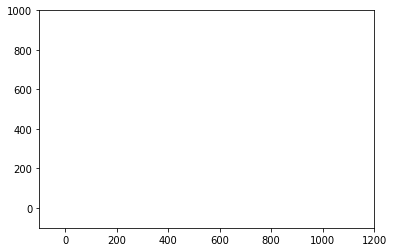

In [27]:
# projectiles 
from math import *
from matplotlib import pyplot as plt
from matplotlib import animation
from IPython.display import HTML

fig = plt.figure()
ax = plt.axes(xlim=(-100, 1200), ylim=(-100, 1000))
line, = ax.plot(0, 0, "ro-",alpha=0.2)
xtrail = []
ytrail = []
# we should try to avoid using global variables
x = 0
y = 0
v0 = 100
dt = 0.1
gravity = 10
angle = 45   # try changing this angle 

vy = v0 * sin(radians(angle))
vx = v0 * cos(radians(angle))

    
def update():
    global x,y, vx, vy, dt
    vy = vy - gravity * dt
    vx = vx
    x = x + vx * dt
    y = y + vy * dt 
    #print('x: {}, y:{}'.format(x,y))
    return x,y 

def animate(i):
    global vx, vy
    x, y = update()
    xtrail.append(x)
    ytrail.append(y)
    start=max((i-100,0))
    line.set_data(xtrail[start:i],ytrail[start:i])
    return line,

anim = animation.FuncAnimation(fig, animate, 
                               frames=360, 
                               interval=20,
                               blit=True)
HTML(anim.to_jshtml())

# Mass Spring System in 1-D 
We assume a spring is attached to a fixed point such that the force in the spring is given by $F = k*x$ where $x$ is the extension of the spring and is given by $x = x_{fix}-x_{mass}$


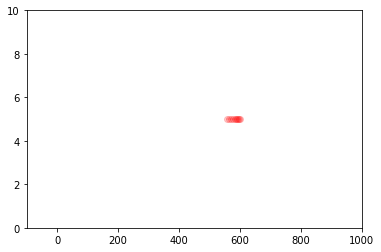

In [28]:
# orbit of a spring mass system 
from math import *
from matplotlib import pyplot as plt
from matplotlib import animation
from IPython.display import HTML

y = 1
fig = plt.figure()
ax = plt.axes(xlim=(-100, 1000), ylim=(0, 10))
line, = ax.plot(0, 0, "ro-",alpha=0.2)
xtrail = []
ytrail = []

vx = 0
x = 200
y = 5
dt = 0.2
fix_x = 400
kspring = 1
mass = 10

def update(x):
    global fix_x, vx, dt, kspring, mass
    extension =  (fix_x - x)
    F = kspring * extension
    # find the angle sin(theta) = (y - fix_y) / extension . cos(theta)
    vx = vx + (F / mass)*dt
    x = x + vx * dt
    return x

def animate(i):
    global x,vx, y
    x = update(x)
    xtrail.append(x)
    ytrail.append(y)
    start=max((i-10,0))
    line.set_data(xtrail[start:i],ytrail[start:i])
    return line,

anim = animation.FuncAnimation(fig, animate, 
                               frames=160, 
                               interval=20,
                               blit=True)
HTML(anim.to_jshtml())

# Exercise - Write Mass Spring System in 2-D
Assume the mass can now move in 2 dimensions and the force in the spring acts in both the $x$ and $y$ directions. Extend the previous code above to allow this.

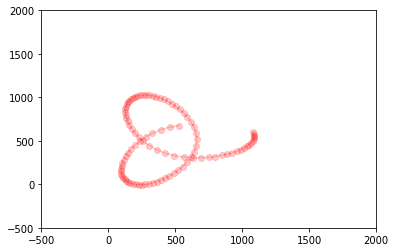

In [29]:
### orbit with 1/r force of gravity 
from math import *
from matplotlib import pyplot as plt
from matplotlib import animation
from IPython.display import HTML

fig = plt.figure()

# 
vx = 20
vy = 0
x = 200  # last point 
y = 200
xtrail = []
ytrail = []

xtrail.append(x)
ytrail.append(y)
dt = 2
fix_x = 500
fix_y = 500
kspring = 500
mass = 1

ax = plt.axes(xlim=(-500, 2000), ylim=(-500, 2000))
line, = ax.plot(x, y, "ro-",alpha=0.2)
    
def update(x, y):
    global fix_x, fix_y, vx, vy, dt, kspring, mass
    extension =  sqrt((fix_x - x)*(fix_x - x) + (fix_y - y)*(fix_y - y))
    F = kspring / extension
    # find the angle sin(theta) = (y - fix_y) / extension . cos(theta)
    Fx = F * (x - fix_x)/ extension
    Fy = F * (y - fix_y)/ extension
    vx = vx - (Fx / mass)*dt
    vy = vy - (Fy / mass)*dt
    
    x = x + vx * dt
    y = y + vy * dt 
    xtrail.append(x)
    ytrail.append(y)
    return x,y 

def animate(i):
    global xtrail,ytrail, x, y, vx, vy
    x, y = update(x,y)
    start=max((i-100,0))
    line.set_data(xtrail[start:i],ytrail[start:i])
    return line,

anim = animation.FuncAnimation(fig, animate, 
                               frames=300, 
                               interval=20,
                               blit=True)

HTML(anim.to_jshtml())